In [36]:
import pandas as pd
import seaborn as sns

In [37]:
dados2 = pd.read_csv('../data/flights4.csv')
dados2.head()

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,delay
0,5,RG,Airbus A320,non-schengen,BYU,15.135172,19.135172,0,2010,False,44.552479
1,19,SR,Boeing 737,schengen,LZW,10.698807,13.698807,0,2010,False,30.931739
2,19,SR,Boeing 737,schengen,LZW,10.698807,13.698807,0,2010,False,12.522989
3,26,RG,Boeing 787,non-schengen,NNN,16.970906,19.970906,0,2010,False,38.306160
4,3,SR,Boeing 737,schengen,YOG,8.431066,11.431066,0,2010,False,18.484254


In [38]:
dados = pd.read_csv('../data/flights7.csv')

In [39]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,delay
0,26,MM,Airbus A320,non-schengen,TCY,8.885071,10.885071,0,2010,False,70.205981
1,10,YE,Airbus A320,non-schengen,TCY,8.939996,11.939996,0,2010,False,38.484609
2,3,BZ,Embraer E175,schengen,TZF,18.635384,22.635384,0,2010,False,2.388305
3,28,BZ,Airbus A330,non-schengen,EMM,15.967963,17.967963,0,2010,False,19.138491
4,15,BZ,Airbus A330,non-schengen,FJB,16.571894,19.571894,0,2010,False,15.016271
...,...,...,...,...,...,...,...,...,...,...,...
71170,3,BZ,Embraer E175,schengen,TZF,18.635384,22.635384,364,2022,True,25.677277
71171,17,BZ,Airbus A330,non-schengen,CNU,16.718722,21.718722,364,2022,True,52.624348
71172,7,MM,Boeing 787,schengen,TZF,8.564949,13.564949,364,2022,True,56.167080
71173,5,BZ,Airbus A320,schengen,ZQO,9.344097,12.344097,364,2022,True,56.758844


In [40]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71175 entries, 0 to 71174
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   flight_id       71175 non-null  int64  
 1   airline         71175 non-null  object 
 2   aircraft_type   71175 non-null  object 
 3   schengen        71175 non-null  object 
 4   origin          71175 non-null  object 
 5   arrival_time    71175 non-null  float64
 6   departure_time  71175 non-null  float64
 7   day             71175 non-null  int64  
 8   year            71175 non-null  int64  
 9   is_holiday      71175 non-null  bool   
 10  delay           71175 non-null  float64
dtypes: bool(1), float64(3), int64(3), object(4)
memory usage: 5.5+ MB


In [41]:
dados['delay']

0        70.205981
1        38.484609
2         2.388305
3        19.138491
4        15.016271
           ...    
71170    25.677277
71171    52.624348
71172    56.167080
71173    56.758844
71174    41.401648
Name: delay, Length: 71175, dtype: float64

In [42]:
from datetime import datetime, timedelta

In [43]:
def convert_day_to_date(day, year):
    base_date = datetime(year=year, month=1, day=1)
    target_date = base_date + timedelta(days=day)
    return target_date.strftime('%Y-%m-%d')  # Format the date as desired

# Convert 'day' column to regular dates
dados['date'] = dados.apply(lambda row: convert_day_to_date(row['day'], row['year']), axis=1)

In [44]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,delay,date
0,26,MM,Airbus A320,non-schengen,TCY,8.885071,10.885071,0,2010,False,70.205981,2010-01-01
1,10,YE,Airbus A320,non-schengen,TCY,8.939996,11.939996,0,2010,False,38.484609,2010-01-01
2,3,BZ,Embraer E175,schengen,TZF,18.635384,22.635384,0,2010,False,2.388305,2010-01-01
3,28,BZ,Airbus A330,non-schengen,EMM,15.967963,17.967963,0,2010,False,19.138491,2010-01-01
4,15,BZ,Airbus A330,non-schengen,FJB,16.571894,19.571894,0,2010,False,15.016271,2010-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...
71170,3,BZ,Embraer E175,schengen,TZF,18.635384,22.635384,364,2022,True,25.677277,2022-12-31
71171,17,BZ,Airbus A330,non-schengen,CNU,16.718722,21.718722,364,2022,True,52.624348,2022-12-31
71172,7,MM,Boeing 787,schengen,TZF,8.564949,13.564949,364,2022,True,56.167080,2022-12-31
71173,5,BZ,Airbus A320,schengen,ZQO,9.344097,12.344097,364,2022,True,56.758844,2022-12-31


In [45]:
import plotly.express as px

In [46]:
px.line(dados[dados['year']==2018], x = 'date', y = 'delay', color = 'airline')

In [47]:
px.histogram(dados, x = 'delay')

In [48]:
px.histogram(dados, x = 'delay', color = 'airline')

In [49]:
px.histogram(dados, x = 'delay', color = 'aircraft_type')

In [50]:
px.histogram(dados, x = 'delay', color = 'origin')

In [51]:
dados['airline'].value_counts()

airline
BZ    47598
YE    14137
MM     9440
Name: count, dtype: int64

In [52]:
dados2.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320    14.619329
Airbus A330    18.453126
Boeing 737     18.105591
Boeing 777     28.754074
Boeing 787      6.050397
Name: delay, dtype: float64

In [53]:
dados2.groupby('origin')['delay'].mean()

origin
BYU    12.671492
ESB    38.448019
GXN     9.075506
JRT    24.759992
LZW     2.374455
NBI    21.873546
NNN    23.106483
PWR    -2.486139
YKZ    11.725588
YOG    -2.088816
Name: delay, dtype: float64

In [54]:
dados.groupby('origin')['delay'].mean()

origin
AUZ    11.307354
CNU    10.401115
CSF    37.383154
EMM    -0.013998
FJB    13.395102
MWL    25.910638
PUA     1.799874
TCY    14.559553
TZF    10.696755
ZQO     5.577149
Name: delay, dtype: float64

In [55]:
dados.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320     21.502073
Airbus A330     -1.303823
Boeing 737      17.095527
Boeing 777      16.497808
Boeing 787      13.064888
Embraer E175     1.211898
Name: delay, dtype: float64

In [56]:
dados.groupby('airline')['delay'].mean()

airline
BZ     3.077595
MM    40.498007
YE    25.772248
Name: delay, dtype: float64

In [57]:
sns.__version__

'0.11.2'

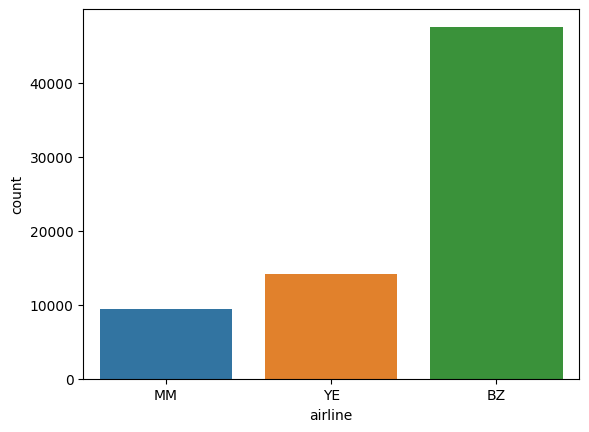

In [58]:
_ = sns.countplot(x=dados['airline'])

In [59]:
dados['aircraft_type'].value_counts()

aircraft_type
Airbus A320     30778
Airbus A330     16654
Boeing 787       9606
Embraer E175     7098
Boeing 737       4722
Boeing 777       2317
Name: count, dtype: int64

c:\Users\Igor\Desktop\dados\.venv\Lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<Axes: xlabel='aircraft_type', ylabel='count'>

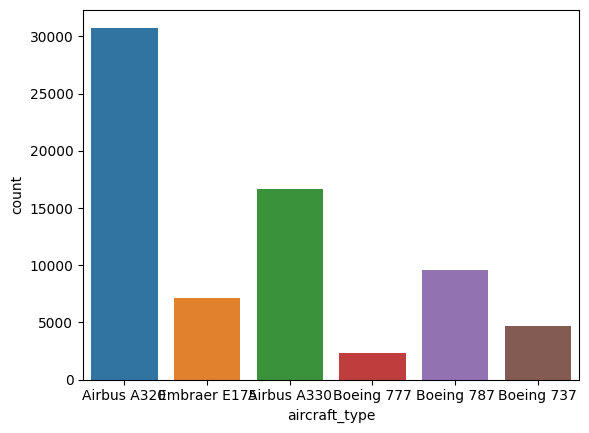

In [60]:
sns.countplot(dados['aircraft_type'])

In [61]:
dados['origin'].value_counts()

origin
TZF    14162
TCY    11899
ZQO    11743
FJB     7206
CNU     4841
EMM     4778
MWL     4776
AUZ     4717
CSF     4674
PUA     2379
Name: count, dtype: int64

c:\Users\Igor\Desktop\dados\.venv\Lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<Axes: xlabel='origin', ylabel='count'>

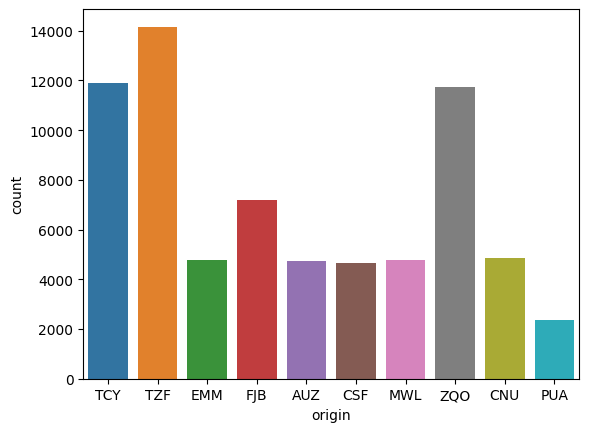

In [62]:
sns.countplot(dados['origin'])

In [63]:
dados['schengen'].value_counts(normalize= True)

schengen
schengen        0.598089
non-schengen    0.401911
Name: proportion, dtype: float64

c:\Users\Igor\Desktop\dados\.venv\Lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<Axes: xlabel='schengen', ylabel='count'>

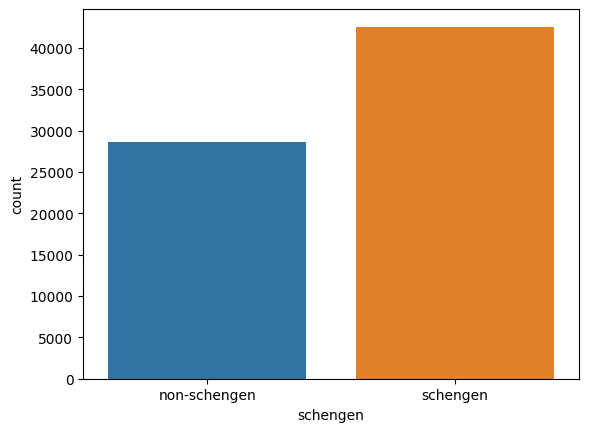

In [64]:
sns.countplot(dados['schengen'])

OptionError: No such keys(s): 'mode.use_inf_as_null'

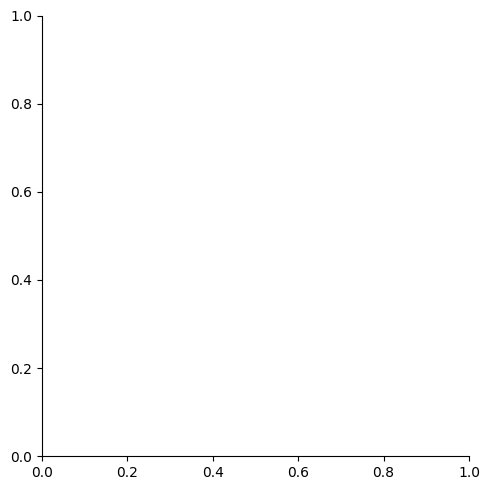

In [65]:
sns.displot(dados['delay'])

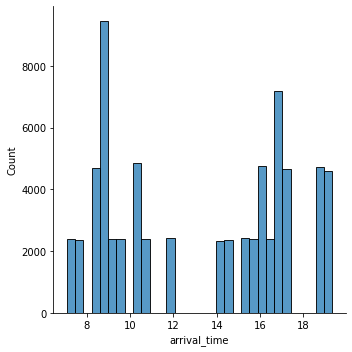

In [ ]:
sns.displot(dados['arrival_time'])

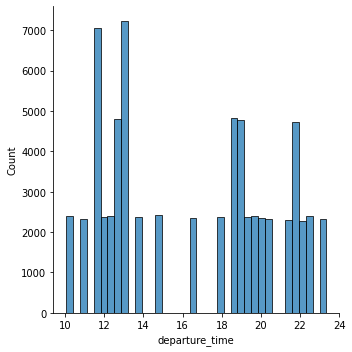

In [ ]:
sns.displot(dados['departure_time'])

c:\Users\Joaom\anaconda3\envs\principal\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='delay'>

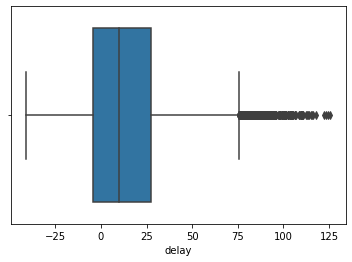

In [ ]:
sns.boxplot(dados['delay'])

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split

In [ ]:
categorical_vars = ['airline', 'aircraft_type', 'origin']

# Perform one-hot encoding
df_encoded_4 = pd.get_dummies(dados, columns=categorical_vars, dtype=int)

df_encoded_4['is_holiday'] = df_encoded_4['is_holiday'].map({False: 0, True: 1})
df_encoded_4['schengen'] = df_encoded_4['schengen'].map({'non-schengen': 0, 'schengen': 1})
df_encoded_4['is_weekend'] = df_encoded_4['day'].apply(lambda day: day % 7 == 0 or day % 7 == 6)

X = df_encoded_4.drop(['flight_id', 'day', 'year','departure_time', 'delay', 'date'], axis=1)
y = df_encoded_4['delay']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # random_state=42

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline

model = RandomForestRegressor()
rfe = RFE(model)
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

rmse = mean_squared_error(y_test, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

r2 = r2_score(y_test, y_pred)
print('R-squared:', r2)

Mean Absolute Error: 6.147280477320801
Mean Squared Error: 70.45088632868844
Root Mean Squared Error: 8.393502625762885
R-squared: 0.8692351530106739


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
model = RandomForestRegressor()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

rmse = mean_squared_error(y_test, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

r2 = r2_score(y_test, y_pred)
print('R-squared:', r2)

Mean Absolute Error: 6.146964904884599
Mean Squared Error: 70.42696514779797
Root Mean Squared Error: 8.392077522747153
R-squared: 0.8692795534394259


In [ ]:
model_boosting = GradientBoostingRegressor()
model_boosting.fit(X_train, y_train)

y_pred = model_boosting.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

rmse = mean_squared_error(y_test, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

r2 = r2_score(y_test, y_pred)
print('R-squared:', r2)

Mean Absolute Error: 6.212975954826903
Mean Squared Error: 71.18275939866155
Root Mean Squared Error: 8.436987578434707
R-squared: 0.8678767134650855


In [ ]:
!python -m pip install statsmodels

In [ ]:
px.scatter(x = y_test, y = y_pred, trendline = 'ols', trendline_color_override = 'red',opacity = 0.2)

In [ ]:
px.scatter(x = y_pred, y = (y_pred - y_test), trendline = 'ols', trendline_color_override = 'red',opacity = 0.2)

In [ ]:
import seaborn as sns

In [ ]:
from scipy.stats import skewnorm
import numpy as np

In [ ]:
a = 5

In [ ]:
r = skewnorm.rvs(a, size=1000)

In [ ]:
import matplotlib.pyplot as plt

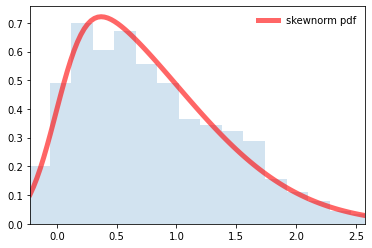

In [ ]:
fig, ax = plt.subplots(1, 1)
x = np.linspace(skewnorm.ppf(0.01, a),
                skewnorm.ppf(0.99, a), 100)
ax.plot(x, skewnorm.pdf(x, a),
       'r-', lw=5, alpha=0.6, label='skewnorm pdf')
ax.hist(r, density=True, bins='auto', histtype='stepfilled', alpha=0.2)
ax.set_xlim([x[0], x[-1]])
ax.legend(loc='best', frameon=False)
plt.show()